In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
from xgboost.callback import EarlyStopping

In [2]:
# Adjust settings to prevent wrapping or truncated displays
pd.set_option('display.max_colwidth', None)  # Ensures no truncation of column contents
pd.set_option('display.max_columns', None)  # Ensures all columns are shown
pd.set_option('display.max_rows', None)  # Ensures no truncation for rows
pd.set_option('display.expand_frame_repr', False)  # Prevents line wrapping for DataFrame

In [3]:
df = pd.read_csv('final_combined_dataset.csv')

df.head(5)

,date,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted
0,2012-01-01,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995
1,2012-01-08,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012
2,2012-01-15,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214
3,2012-01-22,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255
4,2012-01-29,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52234 entries, 0 to 52233
Data columns (total 22 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   date                                  52234 non-null  object 
 1   week                                  52234 non-null  int64  
 2   cases                                 52234 non-null  int64  
 3   population                            52234 non-null  int64  
 4   tempe_min                             52234 non-null  float64
 5   humidity_max                          52234 non-null  float64
 6   humidity_avg                          52234 non-null  float64
 7   humidity_min                          52234 non-null  float64
 8   temp_avg                              52234 non-null  float64
 9   temp_max                              52234 non-null  float64
 10  city                                  52234 non-null  object 
 11  geocode        

In [5]:
# Shift the cases column to create the 2-weeks-ahead target
df['cases_2w_ahead'] = df.groupby('geocode')['cases'].shift(-2)

# Drop the last 2 rows for each municipality (since they won't have a future target)
df = df.dropna(subset=['cases_2w_ahead']).reset_index(drop=True)

df.head(10)

,date,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead
0,2012-01-01,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995,19.0
1,2012-01-08,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012,33.0
2,2012-01-15,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214,36.0
3,2012-01-22,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255,39.0
4,2012-01-29,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0
5,2012-02-05,201206,39,207044,19.571429,81.571429,43.494048,22.142857,28.614927,33.571429,angra dos reis,3300100,0.857159,0.858000,3.8170,25.9830,3.8228,26.0478,-44.319627,-23.009116,18.836576,8.766989,33.0
6,2012-02-12,201207,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,3300100,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,17.870598,12.823065,46.0
7,2012-02-19,201208,33,207044,21.857143,74.000000,51.458425,34.428571,27.253296,31.285714,angra dos reis,3300100,0.859142,0.858000,0.5962,4.0133,0.4783,3.2643,-44.319627,-23.009116,15.938641,12.077424,42.0
8,2012-02-26,201209,46,207044,20.714286,80.142857,43.760989,21.285714,28.902930,34.000000,angra dos reis,3300100,0.860082,0.858000,0.8143,3.8456,0.8171,3.8703,-44.319627,-23.009116,22.217500,6.661086,38.0
9,2012-03-04,201210,42,207044,20.428571,71.714286,48.333639,28.428571,26.467491,30.857143,angra dos reis,3300100,0.860933,0.861567,1.1867,5.3867,0.6647,3.8741,-44.319627,-23.009116,20.285543,3.513488,52.0


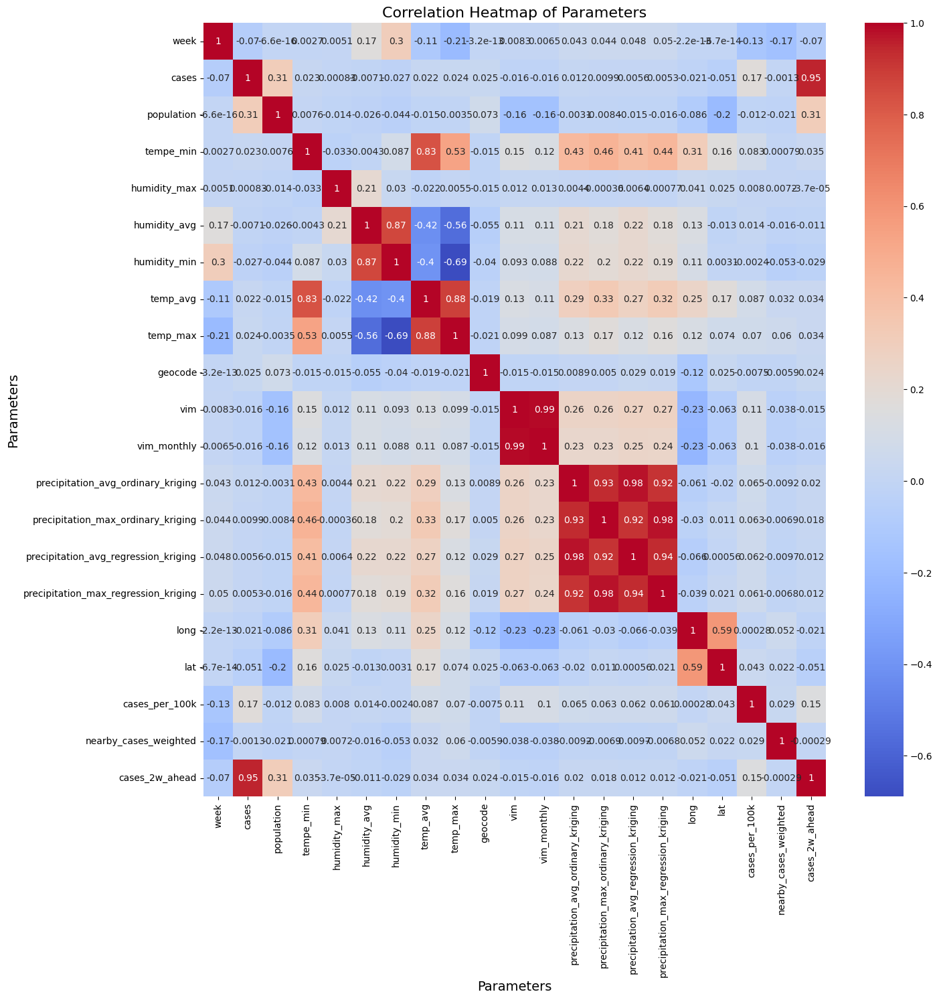

In [6]:
# Calculate the correlation matrix
s = df.select_dtypes(include="number").corr()

# Create the heatmap
plt.figure(figsize=(15, 15))
heatmap = sns.heatmap(s, annot=True, cmap="coolwarm")

plt.xlabel("Parameters", fontsize=14)
plt.ylabel("Parameters", fontsize=14)
plt.title("Correlation Heatmap of Parameters", fontsize=16)

plt.show()

In [7]:
# Ensure 'week' is numeric to allow mathematical operations; invalid values become NaN
df['week'] = pd.to_numeric(df['week'], errors='coerce')

# Convert 'date' to datetime format for easier manipulation and analysis
df['date'] = pd.to_datetime(df['date'])

# Add ordinal date
df['date_ordinal'] = df['date'].apply(lambda x: x.toordinal())

# Extract year/month features
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

# Extract the week number (last two digits of 'week')
df['week_num'] = df['week'] % 100

# Add cyclic representations for month and week
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
df['week_sin'] = np.sin(2 * np.pi * df['week_num'] / 52)
df['week_cos'] = np.cos(2 * np.pi * df['week_num'] / 52)

# Drop the original 'date' and redundant 'month' and 'week_num' columns
df = df.drop(columns=['date', 'month', 'week_num'])
df.head(5)

,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead,date_ordinal,year,month_sin,month_cos,week_sin,week_cos
0,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995,19.0,734503,2012,0.5,0.866025,0.120537,0.992709
1,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012,33.0,734510,2012,0.5,0.866025,0.239316,0.970942
2,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214,36.0,734517,2012,0.5,0.866025,0.354605,0.935016
3,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255,39.0,734524,2012,0.5,0.866025,0.464723,0.885456
4,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0,734531,2012,0.5,0.866025,0.568065,0.822984


In [8]:
# Add lag features to capture the relationship between current and past cases
df['cases_lag0'] = df.groupby('geocode')['cases'].shift(0)
df['cases_lag1'] = df.groupby('geocode')['cases'].shift(1)

df['precipitation_avg_ordinary_kriging_lag3'] = df.groupby('geocode')['precipitation_avg_ordinary_kriging'].shift(3)
df['precipitation_avg_ordinary_kriging_lag4'] = df.groupby('geocode')['precipitation_avg_ordinary_kriging'].shift(4)

df.head(5)

,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag0,cases_lag1,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4
0,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995,19.0,734503,2012,0.5,0.866025,0.120537,0.992709,32,NaN,NaN,NaN
1,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012,33.0,734510,2012,0.5,0.866025,0.239316,0.970942,40,32.0,NaN,NaN
2,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214,36.0,734517,2012,0.5,0.866025,0.354605,0.935016,19,40.0,NaN,NaN
3,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255,39.0,734524,2012,0.5,0.866025,0.464723,0.885456,33,19.0,5.6804,NaN
4,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0,734531,2012,0.5,0.866025,0.568065,0.822984,36,33.0,4.0716,5.6804


In [9]:
# Drop the first 4 rows from each 'geocode' group (due to NaNs in lag features)
df = (
    df.groupby('geocode', group_keys=False)
      .apply(lambda group: group.iloc[4:])
      .reset_index(drop=True)
)

df.head(5)

C:\Users\user\AppData\Local\Temp\ipykernel_19944\2209346424.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.iloc[4:])


,week,cases,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag0,cases_lag1,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4
0,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0,734531,2012,0.500000,0.866025,0.568065,0.822984,36,33.0,4.0716,5.6804
1,201206,39,207044,19.571429,81.571429,43.494048,22.142857,28.614927,33.571429,angra dos reis,3300100,0.857159,0.858000,3.8170,25.9830,3.8228,26.0478,-44.319627,-23.009116,18.836576,8.766989,33.0,734538,2012,0.866025,0.500000,0.663123,0.748511,39,36.0,2.0555,4.0716
2,201207,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,3300100,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,17.870598,12.823065,46.0,734545,2012,0.866025,0.500000,0.748511,0.663123,37,39.0,1.5416,2.0555
3,201208,33,207044,21.857143,74.000000,51.458425,34.428571,27.253296,31.285714,angra dos reis,3300100,0.859142,0.858000,0.5962,4.0133,0.4783,3.2643,-44.319627,-23.009116,15.938641,12.077424,42.0,734552,2012,0.866025,0.500000,0.822984,0.568065,33,37.0,2.8204,1.5416
4,201209,46,207044,20.714286,80.142857,43.760989,21.285714,28.902930,34.000000,angra dos reis,3300100,0.860082,0.858000,0.8143,3.8456,0.8171,3.8703,-44.319627,-23.009116,22.217500,6.661086,38.0,734559,2012,0.866025,0.500000,0.885456,0.464723,46,33.0,3.8170,2.8204


In [10]:
# Split into train and test sets
train_df = df[df['year'] <= 2020]
test_df = df[df['year'] >= 2021]

print("Training set shape:", train_df.shape)
print("Test set shape:", test_df.shape)

Training set shape: (42406, 32)
Test set shape: (9282, 32)


In [11]:
# X_train_df = train_df.drop(columns=['cases_per_100k','cases','cases_2w_ahead'])
# y_train = train_df[['cases_2w_ahead']]

# X_test_df = test_df.drop(columns=['cases_per_100k','cases','cases_2w_ahead'])
# y_test = test_df[['cases_2w_ahead']]

X_train_df = train_df.drop(columns=['cases','cases_2w_ahead'])
y_train = train_df[['cases_2w_ahead']]

X_test_df = test_df.drop(columns=['cases','cases_2w_ahead'])
y_test = test_df[['cases_2w_ahead']]

In [12]:
X_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42406 entries, 0 to 51585
Data columns (total 30 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   week                                     42406 non-null  int64  
 1   population                               42406 non-null  int64  
 2   tempe_min                                42406 non-null  float64
 3   humidity_max                             42406 non-null  float64
 4   humidity_avg                             42406 non-null  float64
 5   humidity_min                             42406 non-null  float64
 6   temp_avg                                 42406 non-null  float64
 7   temp_max                                 42406 non-null  float64
 8   city                                     42406 non-null  object 
 9   geocode                                  42406 non-null  int64  
 10  vim                                      42406 non-

In [13]:
y_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42406 entries, 0 to 51585
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   cases_2w_ahead  42406 non-null  float64
dtypes: float64(1)
memory usage: 662.6 KB


In [14]:
# Exclude columns_to_not_scale and the target variable from scaling
feature_cols_to_not_scale = ['geocode', 'date_ordinal', 'year', 'month_sin', 'month_cos', 'week_sin', 'week_cos', 'week', 'lat', 'long']

# Select numeric feature columns for scaling from X_train or X_test
feature_cols_to_scale = X_train_df.select_dtypes(include=['float64', 'int64', 'int32']).columns.difference(feature_cols_to_not_scale)

# Initialize scalers
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

# Scale the selected numeric features
X_train_df[feature_cols_to_scale] = feature_scaler.fit_transform(X_train_df[feature_cols_to_scale])
X_test_df[feature_cols_to_scale] = feature_scaler.transform(X_test_df[feature_cols_to_scale])

# Scale the target variable
y_train = target_scaler.fit_transform(y_train)
y_test = target_scaler.transform(y_test)

In [15]:
X_train_df.describe()

,week,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag0,cases_lag1,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4
count,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,4.240600e+04,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,42406.000000,4.240600e+04,4.240600e+04,4.240600e+04,4.240600e+04,42406.000000,42406.000000,42406.000000,42406.000000
mean,201630.682403,0.027183,0.709073,0.011608,0.244187,0.529196,0.646189,0.312917,3.303131e+06,0.688851,0.687655,0.148451,0.115895,0.129135,0.114369,-42.814225,-22.282376,0.005939,0.011674,736158.491416,2016.027897,-6.935731e-03,-9.292118e-03,-2.013105e-03,-3.859882e-03,0.001320,0.001325,0.147724,0.147751
std,257.050316,0.106431,0.136926,0.008448,0.054188,0.198401,0.130246,0.077567,1.849926e+03,0.165090,0.165010,0.144683,0.103170,0.129096,0.104460,0.877839,0.537885,0.027327,0.043786,941.661467,2.567839,7.074604e-01,7.066746e-01,7.080457e-01,7.061699e-01,0.015741,0.015755,0.143269,0.143307
min,201205.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.300100e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-44.710859,-23.219414,0.000000,0.000000,734531.000000,2012.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,201417.000000,0.001932,0.614865,0.010665,0.209296,0.373239,0.564504,0.267838,3.301504e+06,0.587457,0.586435,0.035396,0.034469,0.029584,0.032409,-43.555670,-22.733937,0.000000,0.000000,735343.000000,2014.000000,-8.660254e-01,-8.660254e-01,-7.485107e-01,-7.485107e-01,0.000000,0.000000,0.035414,0.035414
50%,201628.500000,0.004666,0.722973,0.011677,0.248487,0.513477,0.657320,0.315761,3.303203e+06,0.720651,0.719807,0.100361,0.087983,0.085531,0.085228,-42.721172,-22.432948,0.000000,0.001177,736158.500000,2016.000000,-2.449294e-16,-1.836970e-16,-3.216245e-16,-1.836970e-16,0.000000,0.000000,0.100492,0.100492
75%,201841.000000,0.019162,0.817568,0.012522,0.283159,0.700117,0.734235,0.361555,3.304706e+06,0.814061,0.812291,0.228272,0.172922,0.197679,0.171681,-42.054815,-21.990230,0.002184,0.005271,736974.000000,2018.000000,5.000000e-01,5.000000e-01,7.485107e-01,6.631227e-01,0.000272,0.000272,0.227895,0.227895
max,202053.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.306305e+06,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-41.050348,-20.929298,1.000000,1.000000,737786.000000,2020.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000


In [16]:
X_test_df.describe()

,week,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag0,cases_lag1,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4
count,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9.282000e+03,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9.282000e+03,9.282000e+03,9.282000e+03,9.282000e+03,9282.000000,9282.000000,9282.000000,9282.000000
mean,202175.029412,0.027183,0.688975,0.011902,0.233843,0.485768,0.656053,0.327191,3.303131e+06,0.689305,0.687652,0.152391,0.120515,0.133964,0.119942,-42.814225,-22.282376,0.001505,0.003106,738146.500000,2021.490196,-1.076545e-02,-2.319633e-02,1.181732e-03,-1.953636e-02,0.000204,0.000202,0.153768,0.155990
std,51.638279,0.106436,0.139445,0.001438,0.044368,0.107577,0.115931,0.053440,1.850004e+03,0.165770,0.165501,0.150012,0.106125,0.132987,0.107843,0.877876,0.537908,0.006392,0.010111,206.115244,0.499931,7.105213e-01,7.032875e-01,7.139433e-01,7.000069e-01,0.001054,0.001050,0.154474,0.157531
min,202101.000000,0.000000,0.067568,0.001351,0.084840,0.148399,0.320890,0.174654,3.300100e+06,-0.001921,-0.001080,0.000000,0.000000,0.000000,0.000000,-44.710859,-23.219414,0.000000,0.000000,737793.000000,2021.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,202126.000000,0.001932,0.594595,0.011141,0.206575,0.414240,0.578691,0.289137,3.301504e+06,0.581107,0.580102,0.035274,0.033650,0.031199,0.032365,-43.555670,-22.733937,0.000000,0.000000,737968.000000,2021.000000,-8.660254e-01,-8.660254e-01,-7.485107e-01,-7.485107e-01,0.000000,0.000000,0.035274,0.035274
50%,202151.500000,0.004666,0.695946,0.011937,0.235671,0.488844,0.661911,0.329073,3.303203e+06,0.719309,0.717403,0.099249,0.084029,0.090403,0.084465,-42.721172,-22.432948,0.000000,0.000573,738146.500000,2021.000000,1.224647e-16,-1.836970e-16,1.608123e-16,-1.836970e-16,0.000000,0.000000,0.099119,0.099119
75%,202225.000000,0.019162,0.804054,0.012846,0.264064,0.558207,0.740103,0.361022,3.304706e+06,0.817517,0.815005,0.241133,0.185228,0.206356,0.187476,-42.054815,-21.990230,0.000500,0.002459,738325.000000,2022.000000,5.000000e-01,5.000000e-01,7.485107e-01,6.631227e-01,0.000068,0.000068,0.238315,0.243320
max,202250.000000,1.000000,0.952703,0.014805,0.348676,0.813526,0.910511,0.472843,3.306305e+06,0.998031,0.996651,1.440903,0.880857,1.312988,0.879840,-41.050348,-20.929298,0.216877,0.280603,738500.000000,2022.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.034335,0.034335,1.440903,1.440903


In [17]:
X_train_df.head(5)

,week,population,tempe_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag0,cases_lag1,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4
0,201205,0.029875,0.621622,0.007943,0.076346,0.176056,0.744210,0.376997,angra dos reis,3300100,0.963737,0.958302,0.245891,0.150921,0.155594,0.126653,-44.319627,-23.009116,0.008014,0.018341,734531,2012,0.500000,0.866025,0.568065,0.822984,0.002448,0.002244,0.354975,0.495235
1,201206,0.029875,0.655405,0.008176,0.030776,0.040493,0.857288,0.435570,angra dos reis,3300100,0.965570,0.966998,0.332778,0.417943,0.296557,0.418930,-44.319627,-23.009116,0.008682,0.008065,734538,2012,0.866025,0.500000,0.663123,0.748511,0.002652,0.002448,0.179205,0.354975
2,201207,0.029875,0.682432,0.007709,0.112676,0.267606,0.735651,0.361022,angra dos reis,3300100,0.967314,0.966998,0.356239,0.473044,0.317441,0.466587,-44.319627,-23.009116,0.008237,0.011796,734545,2012,0.866025,0.500000,0.748511,0.663123,0.002516,0.002652,0.134402,0.179205
3,201208,0.029875,0.763514,0.005700,0.079875,0.191901,0.798631,0.392971,angra dos reis,3300100,0.968765,0.966998,0.051979,0.064555,0.037105,0.052500,-44.319627,-23.009116,0.007346,0.011110,734552,2012,0.866025,0.500000,0.822984,0.568065,0.002244,0.002516,0.245891,0.134402
4,201209,0.029875,0.709459,0.007709,0.032421,0.029930,0.869694,0.443557,angra dos reis,3300100,0.970280,0.966998,0.070993,0.061857,0.063387,0.062246,-44.319627,-23.009116,0.010240,0.006127,734559,2012,0.866025,0.500000,0.885456,0.464723,0.003128,0.002244,0.332778,0.245891


In [18]:
print("X_train, y_train, X_test, y_test shapes (before):")
print("X_train:", X_train_df.shape)
print("y_train:", y_train.shape)
print("X_test:", X_test_df.shape)
print("y_test:", y_test.shape)

X_train, y_train, X_test, y_test shapes (before):
X_train: (42406, 30)
y_train: (42406, 1)
X_test: (9282, 30)
y_test: (9282, 1)


In [19]:
# Feature columns to be considered
feature_cols = [
    'week',
    'geocode',
    'cases_lag0',
    'cases_lag1',
    'cases_per_100k',
    'vim',
    'week_sin',
    'week_cos',
    'month_sin',
    'month_cos',
    'precipitation_avg_ordinary_kriging_lag3',
    'precipitation_avg_ordinary_kriging_lag4',
    'temp_avg',
    'humidity_avg'
]

# Selecting only the desired columns from X_train and X_test
X_train = X_train_df[feature_cols]
X_test = X_test_df[feature_cols]

# Convert geocode to categorical
X_train['geocode'] = X_train['geocode'].astype('category')
X_test['geocode'] = X_test['geocode'].astype('category')

C:\Users\user\AppData\Local\Temp\ipykernel_19944\576866827.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['geocode'] = X_train['geocode'].astype('category')
C:\Users\user\AppData\Local\Temp\ipykernel_19944\576866827.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['geocode'] = X_test['geocode'].astype('category')


In [20]:
# Verify the new shapes
print("X_train, y_train, X_test, y_test shapes (after):")
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)
print("X_test:", X_test.shape)
print("y_test:", y_test.shape)

X_train, y_train, X_test, y_test shapes (after):
X_train: (42406, 14)
y_train: (42406, 1)
X_test: (9282, 14)
y_test: (9282, 1)


In [21]:
X_train.head(5)

,week,geocode,cases_lag0,cases_lag1,cases_per_100k,vim,week_sin,week_cos,month_sin,month_cos,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4,temp_avg,humidity_avg
0,201205,3300100,0.002448,0.002244,0.008014,0.963737,0.568065,0.822984,0.500000,0.866025,0.354975,0.495235,0.744210,0.076346
1,201206,3300100,0.002652,0.002448,0.008682,0.965570,0.663123,0.748511,0.866025,0.500000,0.179205,0.354975,0.857288,0.030776
2,201207,3300100,0.002516,0.002652,0.008237,0.967314,0.748511,0.663123,0.866025,0.500000,0.134402,0.179205,0.735651,0.112676
3,201208,3300100,0.002244,0.002516,0.007346,0.968765,0.822984,0.568065,0.866025,0.500000,0.245891,0.134402,0.798631,0.079875
4,201209,3300100,0.003128,0.002244,0.010240,0.970280,0.885456,0.464723,0.866025,0.500000,0.332778,0.245891,0.869694,0.032421


In [22]:
X_test.head(5)

,week,geocode,cases_lag0,cases_lag1,cases_per_100k,vim,week_sin,week_cos,month_sin,month_cos,precipitation_avg_ordinary_kriging_lag3,precipitation_avg_ordinary_kriging_lag4,temp_avg,humidity_avg
466,202101,3300100,0.000068,0.000000,0.000223,0.963220,0.120537,0.992709,0.5,0.866025,0.348628,0.540021,0.751505,0.202532
467,202102,3300100,0.000000,0.000068,0.000000,0.966169,0.239316,0.970942,0.5,0.866025,0.618504,0.348628,0.764861,0.219278
468,202103,3300100,0.000000,0.000000,0.000000,0.969017,0.354605,0.935016,0.5,0.866025,0.461565,0.618504,0.865423,0.120433
469,202104,3300100,0.000000,0.000000,0.000000,0.971627,0.464723,0.885456,0.5,0.866025,0.304426,0.461565,0.878550,0.104945
470,202105,3300100,0.000068,0.000000,0.000223,0.973972,0.568065,0.822984,0.5,0.866025,0.359700,0.304426,0.723372,0.225312


In [23]:
# Define the XGBoost regressor model with adjustments to reduce overfitting
xgb_model = xgb.XGBRegressor(
    n_estimators=200,             # Number of trees (keep this for now, will tune via GridSearch)
    max_depth=4,                  # Reduced max_depth to decrease tree complexity
    learning_rate=0.1,            # Keep learning rate for now, can be tuned
    subsample=0.8,                # Fraction of samples for each tree
    colsample_bytree=0.8,         # Fraction of features for each tree
    random_state=42,              # For reproducibility
    objective='reg:squarederror', # Regression objective
    enable_categorical=True,
    gamma=0.005,                    # Added gamma to control overfitting
    reg_lambda=1,                    # L2 regularization (default value: 1, adjust for regularization)
    alpha=0.5,                    # L1 regularization (can be tuned further)
    min_child_weight=5            # Increase min_child_weight to avoid learning noise in leaves
)

In [24]:
# Define hyperparameters to tune using GridSearchCV
param_grid = {
    'n_estimators': [200],           # A couple of options for the number of trees
    'max_depth': [4],                   # Max depth of trees, typically 3-5 is a good range for controlling complexity
    'learning_rate': [0.05],                # Learning rate, let's stick to a common value to avoid excessive time
    'subsample': [0.8],                    # Fraction of samples for each tree, typically around 0.8-1.0 works well
    'colsample_bytree': [0.8],             # Fraction of features for each tree, same reasoning as subsample
    'reg_lambda': [0.5],                   # Standard L2 regularization
    'alpha': [0.1, 0.5],                        # Standard L1 regularization
    'gamma': [0],
    'min_child_weight': [5]                # Minimum child weight, 1 is often good for most datasets
}

# Perform GridSearchCV for hyperparameter tuning with cross-validation
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Use negative mean squared error for regression
    cv=5,                             # 5-fold cross-validation
    verbose=1,                        # Display progress
    n_jobs=-1                          # Use all available CPUs for faster computation
)

In [25]:
# Train the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Extract the best parameters
best_params = grid_search.best_params_

# Get the best parameters from GridSearchCV
print("Best Hyperparameters found: ", best_params)

# Add the required additional parameters manually
best_params.update({
    'objective': 'reg:squarederror',  # Regression task
    'eval_metric': 'rmse',            # Evaluation metric
    'random_state': 42,               # Set the random state for reproducibility
    'enable_categorical': True        # Enable categorical features handling in XGBoost
})

Fitting 5 folds for each of 2 candidates, totalling 10 fits
Best Hyperparameters found:  {'alpha': 0.5, 'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 200, 'reg_lambda': 0.5, 'subsample': 0.8}


In [26]:
# Use the best hyperparameters to initialize a new XGBoost model
best_xgb_model = xgb.XGBRegressor(**best_params)

# Train the best XGBoost model
best_xgb_model.fit(X_train, y_train)

XGBRegressor(alpha=0.5, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=True, eval_metric='rmse', feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, ...)

In [27]:
# Make predictions with the best model
y_pred_train = best_xgb_model.predict(X_train)
y_pred_test = best_xgb_model.predict(X_test)

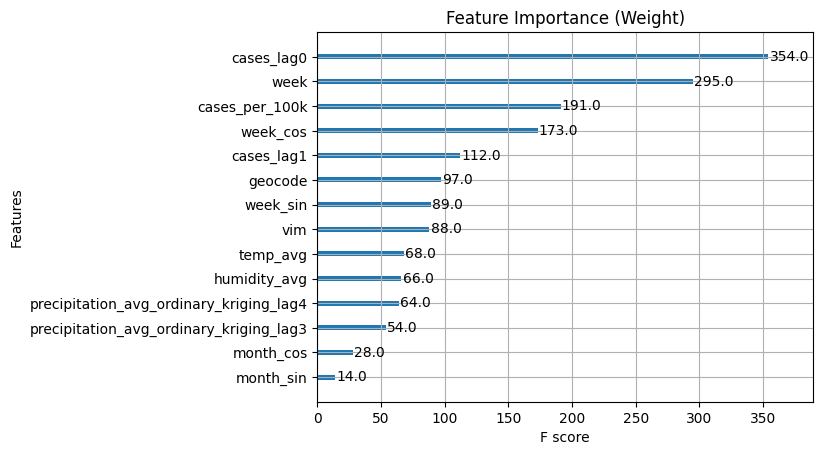

In [28]:
# Feature importance plot
import matplotlib.pyplot as plt

xgb.plot_importance(best_xgb_model, importance_type='weight', title='Feature Importance (Weight)')
plt.show()

In [29]:
# Get unique geocodes
unique_geocodes = X_test['geocode'].unique()

# Print the entire array using numpy
print(np.array2string(unique_geocodes, separator=', '))

[3300100, 3300159, 3300209, 3300225, 3300233, 3300258, 3300308, 3300407,
 3300456, 3300506, 3300605, 3300704, 3300803, 3300902, 3300936, 3300951,
 3301009, 3301108, 3301157, 3301207, 3301306, 3301405, 3301504, 3301603,
 3301702, 3301801, 3301850, 3301876, 3301900, 3302007, 3302056, 3302106,
 3302205, 3302254, 3302270, 3302304, 3302403, 3302452, 3302502, 3302601,
 3302700, 3302809, 3302908, 3303005, 3303104, 3303203, 3303302, 3303401,
 3303500, 3303609, 3303708, 3303807, 3303856, 3303906, 3303955, 3304003,
 3304102, 3304110, 3304128, 3304144, 3304151, 3304201, 3304300, 3304409,
 3304508, 3304524, 3304557, 3304607, 3304706, 3304755, 3304805, 3304904,
 3305000, 3305109, 3305133, 3305158, 3305208, 3305307, 3305406, 3305505,
 3305554, 3305604, 3305703, 3305752, 3305802, 3305901, 3306008, 3306107,
 3306156, 3306206, 3306305]


In [30]:
# Inverse transform the target variable for test data and predictions
y_test_original = target_scaler.inverse_transform(y_test)
y_pred_test_original = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1))

# Inverse transform the target variable for train data and predictions
y_train_original = target_scaler.inverse_transform(y_train)
y_pred_train_original = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1))

# Convert to Pandas Series with correct indices
y_test_original = pd.Series(y_test_original.flatten(), index=X_test.index)
y_pred_test_original = pd.Series(y_pred_test_original.flatten(), index=X_test.index)
y_train_original = pd.Series(y_train_original.flatten(), index=X_train.index)
y_pred_train_original = pd.Series(y_pred_train_original.flatten(), index=X_train.index)

# Evaluate the model using inverse-transformed values
train_mae = mean_absolute_error(y_train_original, y_pred_train_original)
test_mae = mean_absolute_error(y_test_original, y_pred_test_original)

train_rmse = np.sqrt(mean_squared_error(y_train_original, y_pred_train_original))
test_rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_test_original))

train_r2 = r2_score(y_train_original, y_pred_train_original)
test_r2 = r2_score(y_test_original, y_pred_test_original)

# Print evaluation metrics
print("Model Evaluation Metrics (Using Inverse-Transformed Values):")
print(f"Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")
print(f"Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
print(f"Train R2 Score: {train_r2:.4f}, Test R2 Score: {test_r2:.4f}")

Model Evaluation Metrics (Using Inverse-Transformed Values):
Train MAE: 5.8708, Test MAE: 1.7927
Train RMSE: 32.5192, Test RMSE: 6.0464
Train R2 Score: 0.9802, Test R2 Score: 0.8506


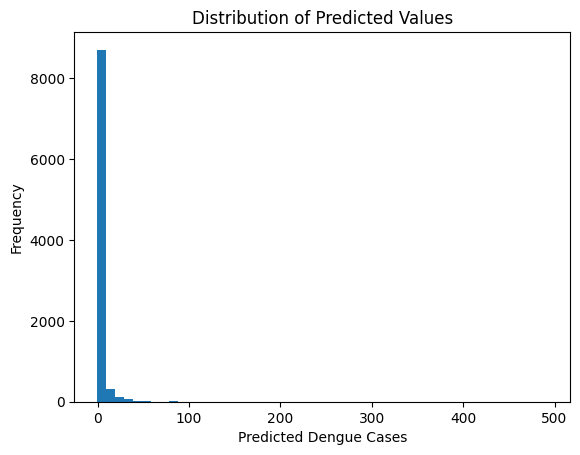

In [31]:
# Check the distribution of predicted values
plt.hist(y_pred_test_original.to_numpy().flatten(), bins=50)
plt.title("Distribution of Predicted Values")
plt.xlabel("Predicted Dengue Cases")
plt.ylabel("Frequency")
plt.show()

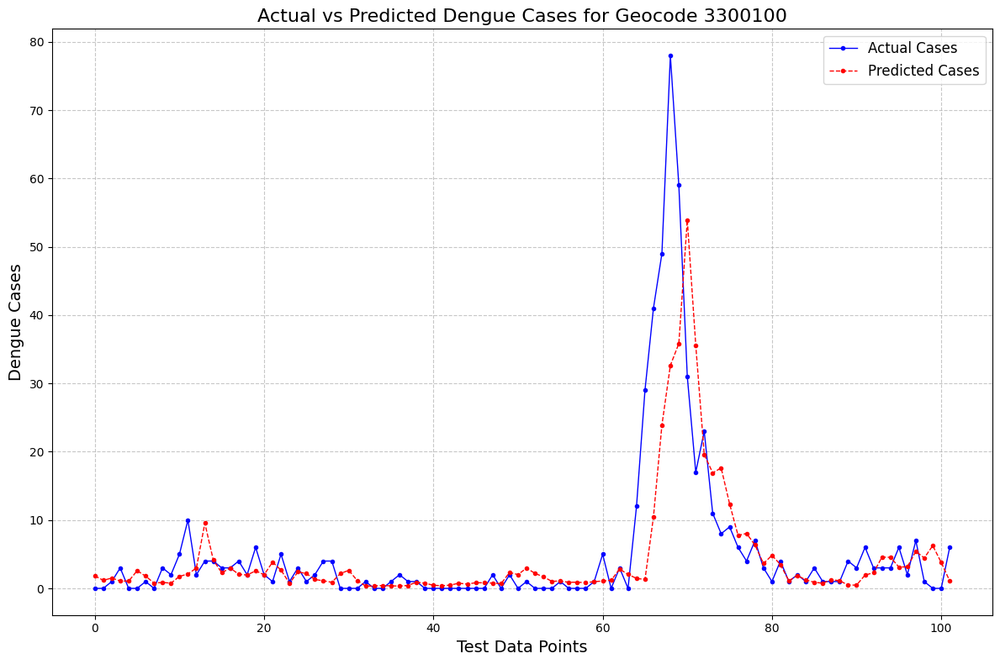

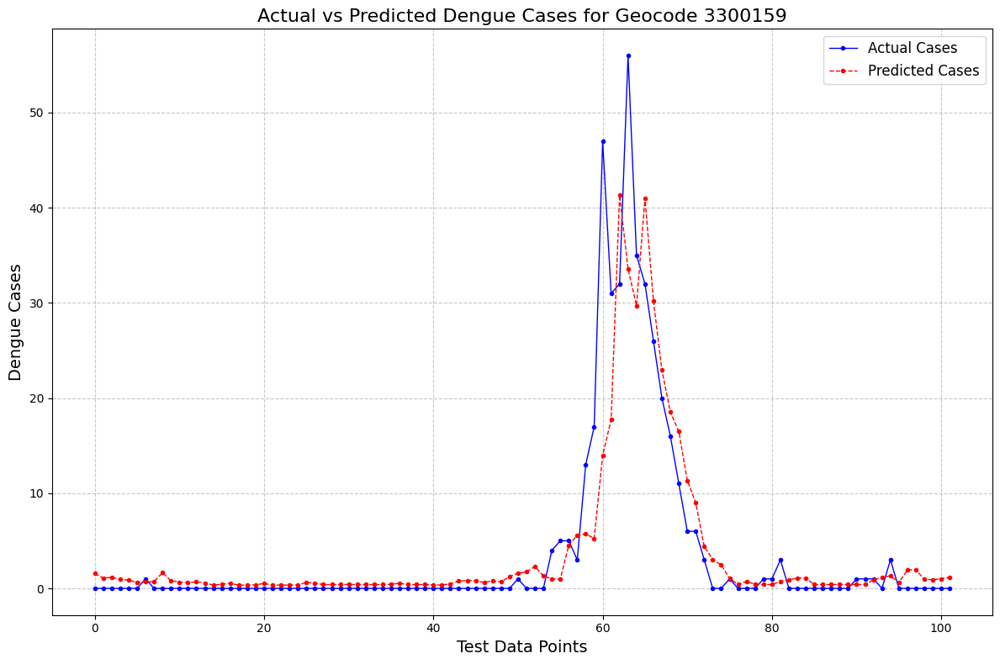

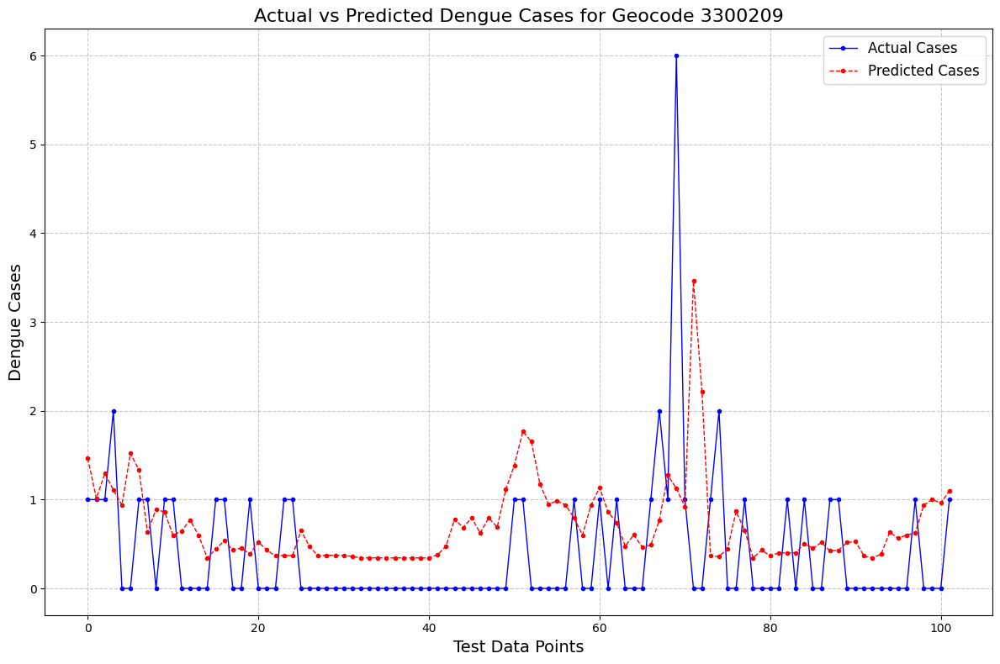

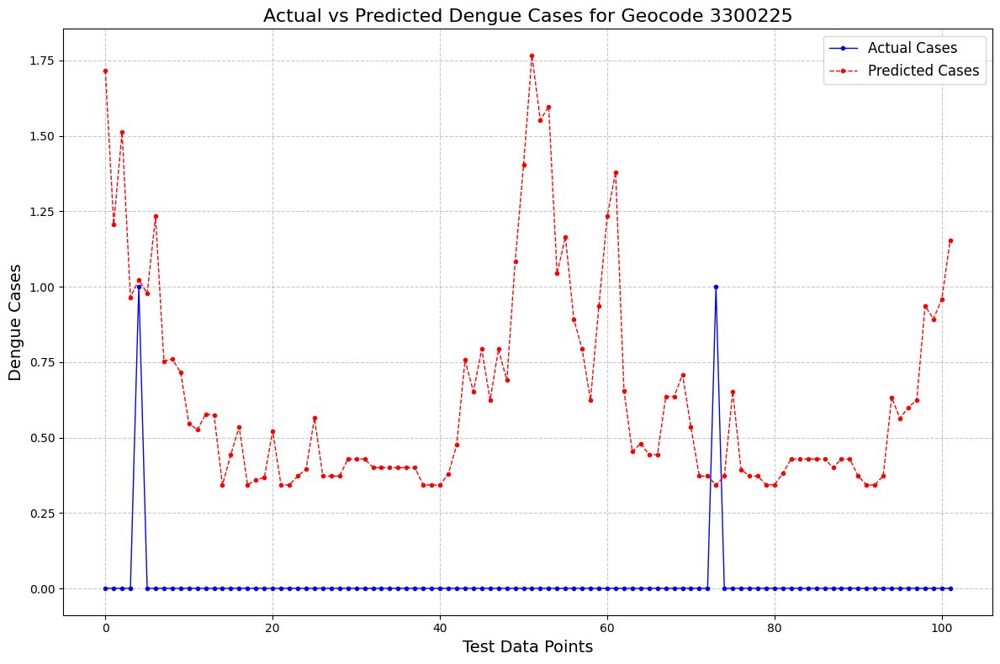

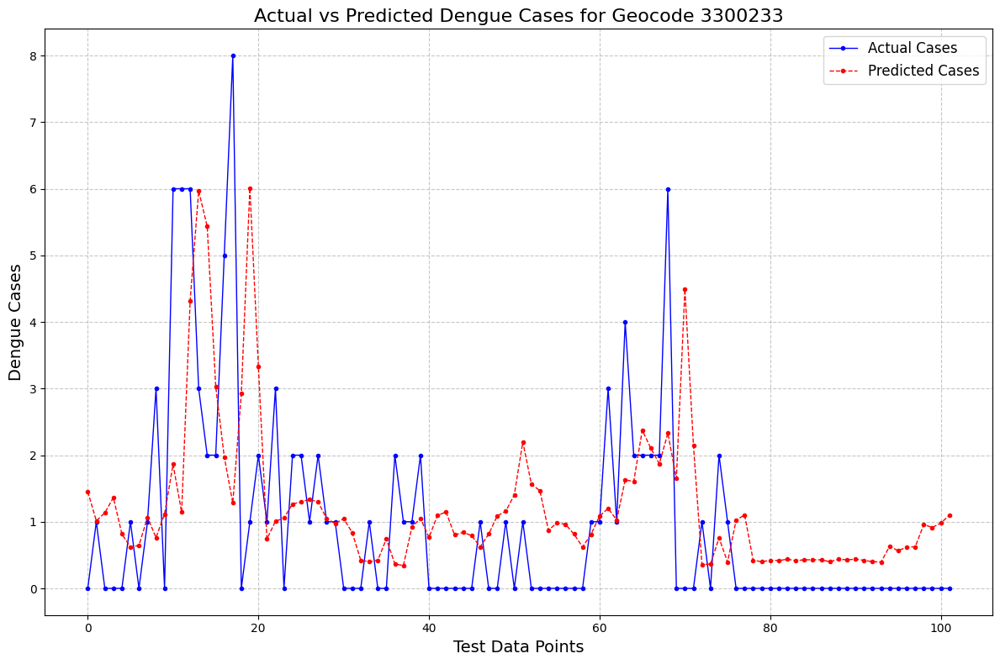

...

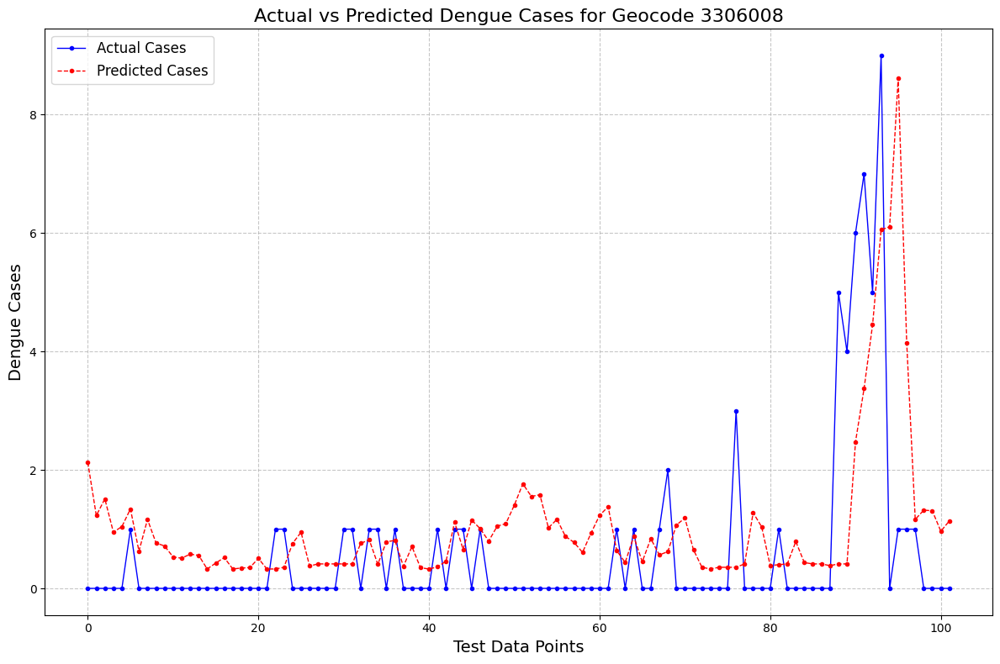

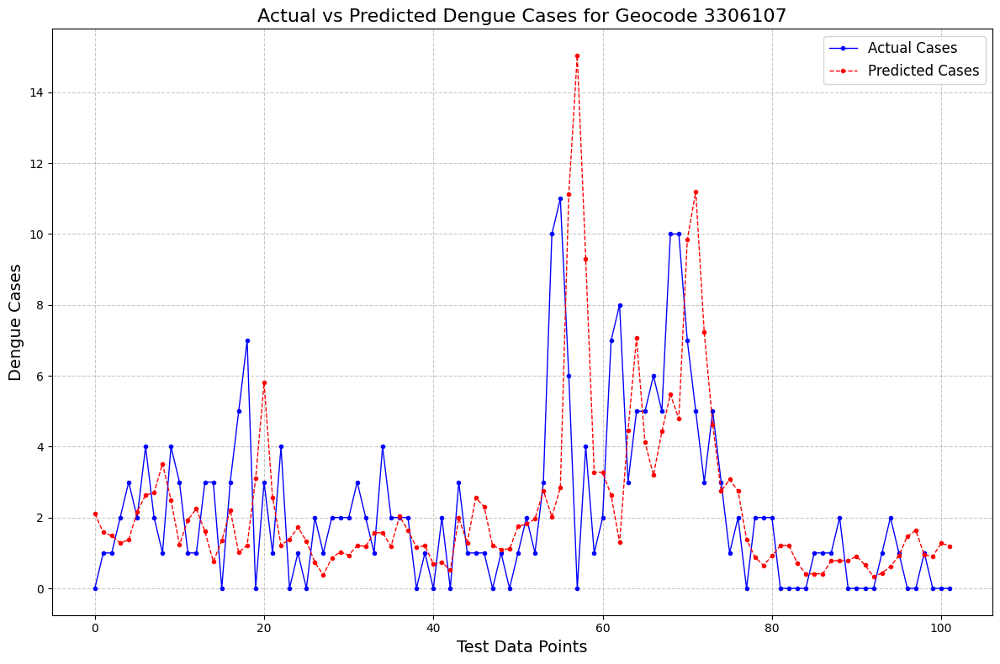

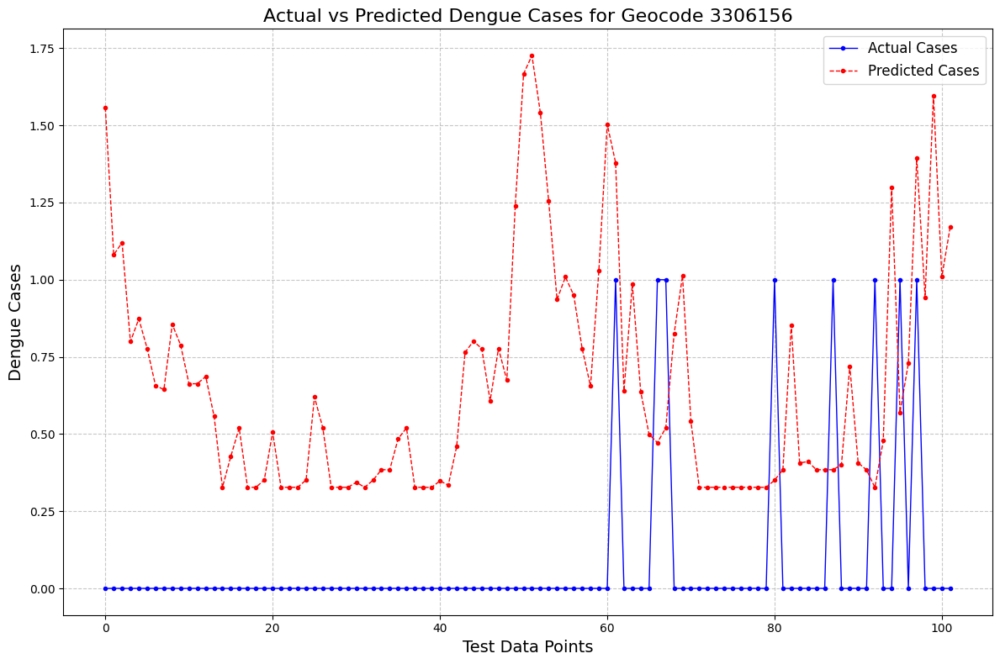

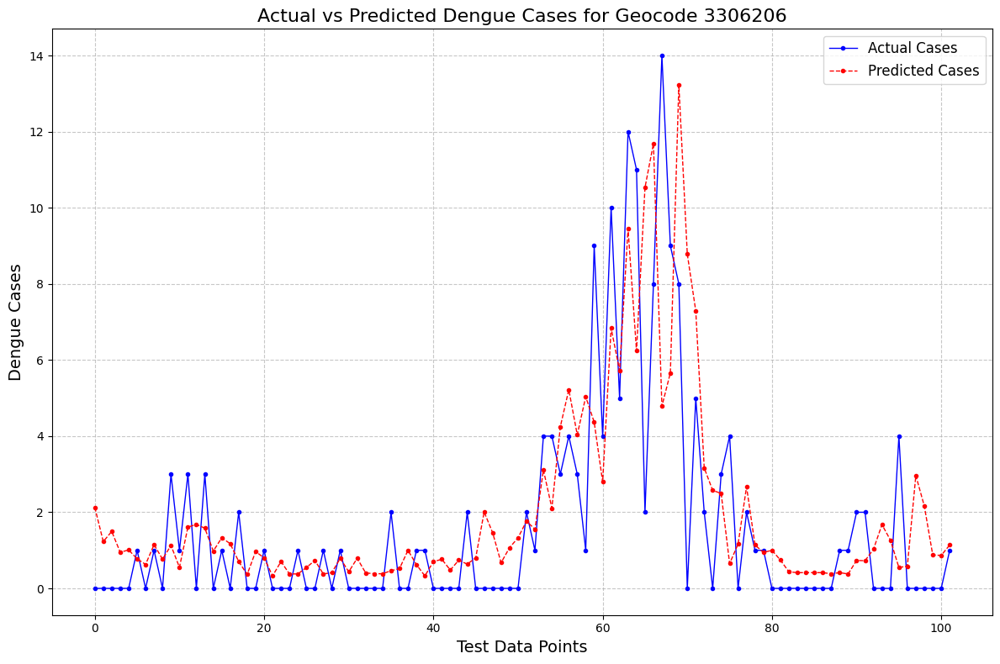

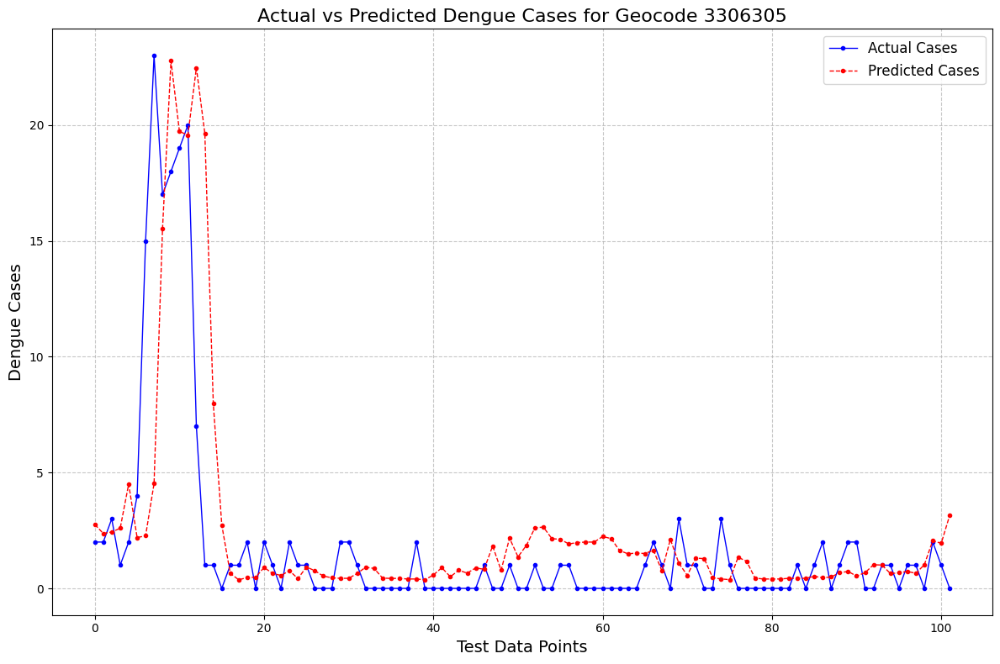

In [32]:
# Loop through all unique geocodes and plot
for geocode_value in unique_geocodes:
    
    # Get indices where the geocode matches
    geocode_indices = X_test[X_test['geocode'] == geocode_value].index
    
    # Filter the transformed data
    y_test_filtered = y_test_original.loc[geocode_indices]
    y_pred_filtered = y_pred_test_original.loc[geocode_indices]
    
    # Create a line plot for actual vs predicted cases
    plt.figure(figsize=(12, 8))
    plt.plot(y_test_filtered.values, label="Actual Cases", marker='.', color='blue', linewidth=1)
    plt.plot(y_pred_filtered.values, label="Predicted Cases", marker='.', color='red', linestyle='--', linewidth=1)
    plt.title(f"Actual vs Predicted Dengue Cases for Geocode {geocode_value}", fontsize=16)
    plt.xlabel("Test Data Points", fontsize=14)
    plt.ylabel("Dengue Cases", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

In [33]:
# Add predictions and actual values back to X_test for 2021 and 2022 splits
X_test_full = X_test_df.copy()
X_test_full['geocode'] = X_test_full['geocode'].astype(str)  # Convert to str for CSV compatibility
X_test_full['actual'] = y_test_original
X_test_full['xgboost_pred'] = y_pred_test_original

# --- Generate CSV for 2021 (meta-model training)
xgboost_preds = X_test_full[X_test_full['year'] == 2021][['geocode', 'week', 'xgboost_pred', 'actual']]
xgboost_preds.to_csv('../base_predictions/xgboost_preds_2021.csv', index=False)

# --- Generate CSV for 2022 (meta-model testing)
xgboost_test_preds = X_test_full[X_test_full['year'] == 2022][['geocode', 'week', 'xgboost_pred', 'actual']]
xgboost_test_preds.to_csv('../base_predictions/xgboost_test_preds_2022.csv', index=False)

print("xgboost_preds.csv and xgboost_test_preds.csv have been saved.")


xgboost_preds.csv and xgboost_test_preds.csv have been saved.
